# Trajectory modeling (xy only) / 仅平面分析

Ignore z and analyze 2D positions/velocities for a target individual and its most related partner.


In [11]:
# Imports & data load（导入与数据读取）
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import swarm
from swarm import data, preprocess
from scipy.signal import savgol_filter

plt.style.use("ggplot")

# TODO: set your folder and range（修改数据路径与范围）
data_folder = "D:/3Ddataset/"  # change to your actual path
dfs = data.read_swarm_batch(data_folder, start=16, end=16)
df_raw = data.merge_dict_of_dfs(dfs)

# Optional smoothing with per-id safe windowing（按个体自适应窗口的安全平滑）
def safe_smooth_group(df, cols, window=5, poly=2):
    df2 = df.copy()
    for c in cols:
        def _smooth(x):
            n = len(x)
            w = min(window if window % 2 == 1 else window - 1, n)
            if w < poly + 2 or w < 3:
                return x
            return savgol_filter(x, window_length=w, polyorder=min(poly, w - 1))
        df2[c] = df2.groupby("id")[c].transform(_smooth)
    return df2

df_raw = safe_smooth_group(df_raw, ["x","y"], window=5, poly=2)

# Standard preprocessing（中心化+速度/加速度/jerk）
df = preprocess.preprocess_full(df_raw)
df.head()

,id,x,z,y,t,vx,vz,vy,ax,az,ay,source,speed,accel,jx,jy,jz,jerk
0,1,0.000000,0.000000,0.000000,0.06,NaN,NaN,NaN,NaN,NaN,NaN,df16,NaN,NaN,NaN,NaN,NaN,NaN
1,1,-111.046539,-67.356619,-35.692225,0.07,-111.046539,-67.356619,-35.692225,NaN,NaN,NaN,df16,134.692921,NaN,NaN,NaN,NaN,NaN
2,1,-110.085453,-65.802223,-38.333567,0.08,0.961086,1.554397,-2.641342,112.007625,68.911016,33.050883,df16,3.211935,135.597924,NaN,NaN,NaN,NaN
3,1,-108.863749,-64.207542,-41.065164,0.09,1.221703,1.594681,-2.731597,0.260617,0.040284,-0.090255,df16,3.390751,0.278730,NaN,NaN,NaN,NaN
4,2,-248.147039,61.435881,256.148911,0.07,NaN,NaN,NaN,NaN,NaN,NaN,df16,NaN,NaN,NaN,NaN,NaN,NaN


## Choose target ID (longest duration) / 选择时长最长的个体

In [12]:
track_stats = df.groupby("id")["t"].agg(["min","max","count"])
track_stats["duration"] = track_stats["max"] - track_stats["min"]
target_id = track_stats.sort_values(["duration","count"], ascending=False).index[0]
print(f"Target id: {target_id}")

times = np.sort(df["t"].unique())
records = []

Target id: 9


## Target time series (xy) / 目标轨迹时间序列

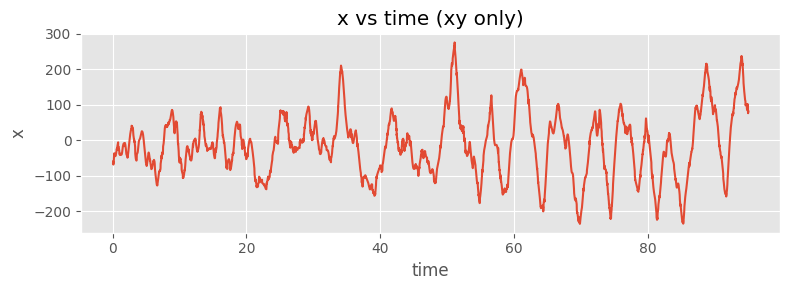

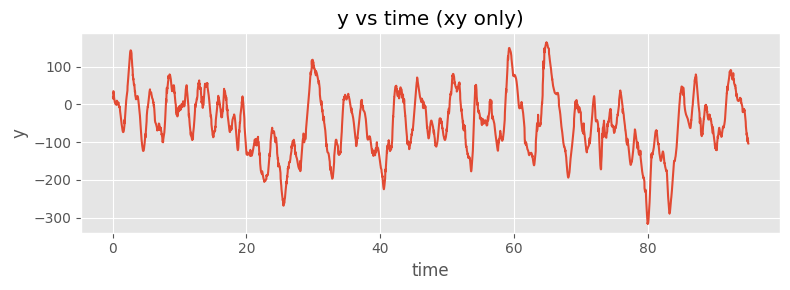

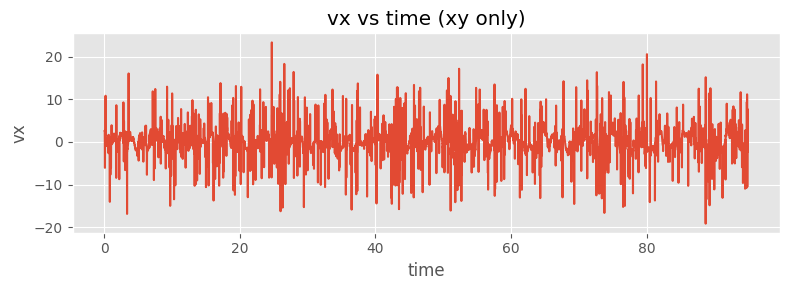

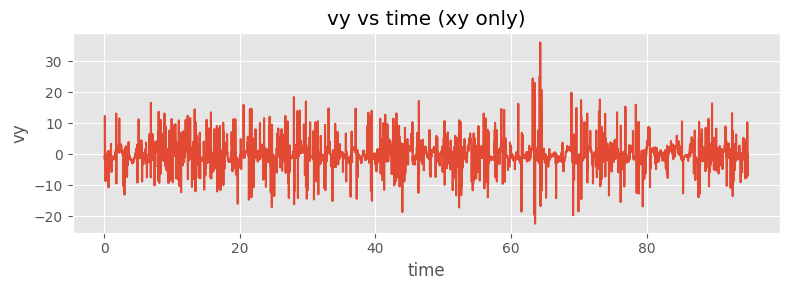

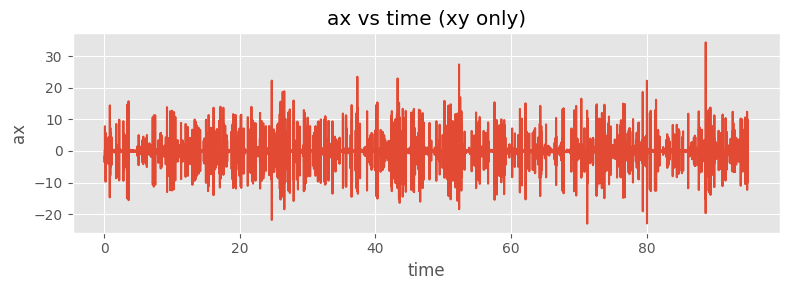

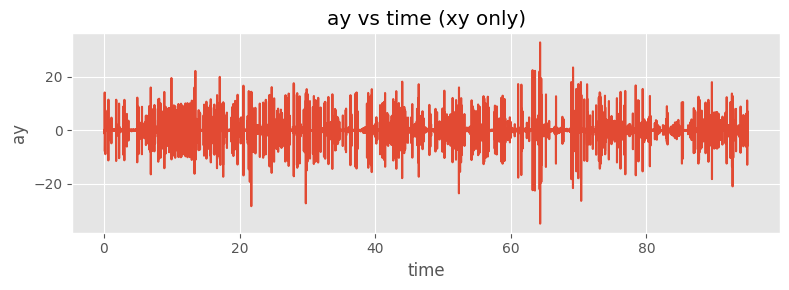

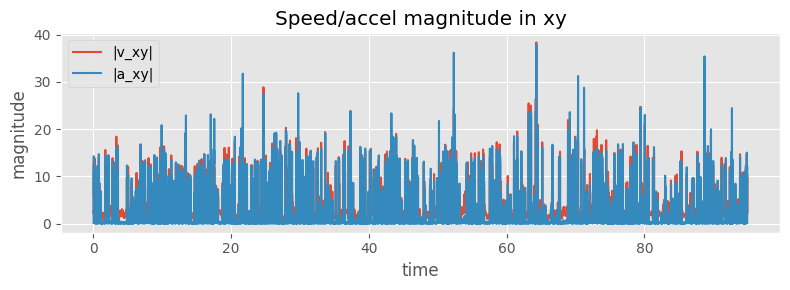

In [13]:
track = df[df["id"] == target_id].sort_values("t").copy()

for c in ["x","y","vx","vy","ax","ay"]:
    plt.figure(figsize=(8,3))
    plt.plot(track["t"], track[c])
    plt.xlabel("time")
    plt.ylabel(c)
    plt.title(f"{c} vs time (xy only)")
    plt.tight_layout()
    plt.show()

track["speed_xy"] = np.linalg.norm(track[["vx","vy"]].values, axis=1)
track["accel_xy"] = np.linalg.norm(track[["ax","ay"]].values, axis=1)

plt.figure(figsize=(8,3))
plt.plot(track["t"], track["speed_xy"], label="|v_xy|")
plt.plot(track["t"], track["accel_xy"], label="|a_xy|")
plt.xlabel("time")
plt.ylabel("magnitude")
plt.title("Speed/accel magnitude in xy")
plt.legend()
plt.tight_layout()
plt.show()

## Framewise similarity (xy) / 逐帧相似度

In [46]:
# Compute per-frame velocity cosine in xy and mean planar distance

def framewise_similarity_xy(df, target_id, min_overlap=5):
    target = df[df["id"] == target_id].sort_values("t")
    ids = [i for i in df["id"].unique() if i != target_id]
    rows = []
    for oid in ids:
        other = df[df["id"] == oid].sort_values("t")
        merged = pd.merge(
            target[["t","x","y","vx","vy"]],
            other[["t","x","y","vx","vy"]],
            on="t",
            suffixes=("_t","_o"),
        )
        n = len(merged)
        if n < min_overlap:
            continue
        vt = merged[["vx_t","vy_t"]].values
        vo = merged[["vx_o","vy_o"]].values
        vt_norm = np.linalg.norm(vt, axis=1)
        vo_norm = np.linalg.norm(vo, axis=1)
        cos = np.sum(vt * vo, axis=1) / (vt_norm * vo_norm + 1e-9)
        mean_cos = float(np.nanmean(cos))
        pt = merged[["x_t","y_t"]].values
        po = merged[["x_o","y_o"]].values
        dist = np.linalg.norm(pt - po, axis=1)
        mean_dist = float(np.nanmean(dist))
        rows.append({"id": oid, "mean_cos_xy": mean_cos, "mean_dist_xy": mean_dist, "n_overlap": n})
    if not rows:
        return pd.DataFrame()
    return pd.DataFrame(rows).sort_values(["mean_cos_xy","n_overlap"], ascending=[False, False])

sim_xy = framewise_similarity_xy(df, target_id, min_overlap=5)
sim_xy.head(10)

,id,mean_cos_xy,mean_dist_xy,n_overlap
274,313,0.992751,218.949495,7
172,196,0.990457,239.541983,7
214,242,0.979633,642.073072,14
439,501,0.973881,330.052782,5
283,326,0.971156,345.237079,12
278,318,0.967204,160.663079,7
217,245,0.942651,304.301880,9
99,113,0.922098,297.530753,11
266,304,0.920408,17.922602,6
407,465,0.917279,262.066478,8


## Pick top partner (xy) and plot trajectories / 选择最相关个体并绘制平面轨迹

Top partner (xy cosine): 313.0


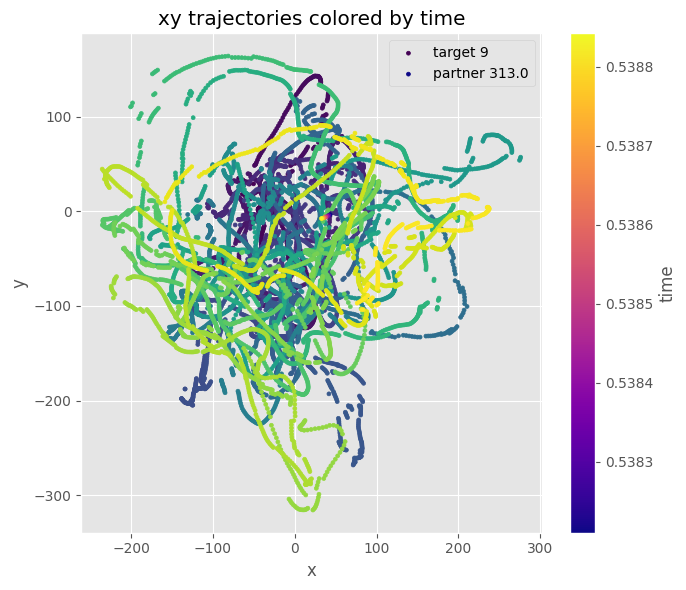

In [47]:
from matplotlib import cm
from matplotlib.colors import Normalize

if sim_xy.empty:
    print("No partner with sufficient overlap.")
else:
    partner_id = sim_xy.iloc[0]["id"]
    print(f"Top partner (xy cosine): {partner_id}")
    tgt = df[df["id"] == target_id].sort_values("t")
    prt = df[df["id"] == partner_id].sort_values("t")
    t_min = min(tgt["t"].min(), prt["t"].min())
    t_max = max(tgt["t"].max(), prt["t"].max())
    norm = Normalize(vmin=t_min, vmax=t_max)
    plt.figure(figsize=(7,6))
    plt.scatter(tgt["x"], tgt["y"], c=norm(tgt["t"]), cmap=cm.viridis, s=8, label=f"target {target_id}")
    plt.scatter(prt["x"], prt["y"], c=norm(prt["t"]), cmap=cm.plasma, s=8, label=f"partner {partner_id}")
    plt.xlabel("x"); plt.ylabel("y")
    plt.title("xy trajectories colored by time")
    cbar = plt.colorbar()
    cbar.set_label("time")
    plt.legend()
    plt.tight_layout()
    plt.show()

## Animated GIF (xy) / 2D 动画导出（可选）

Animating target 9 vs partner 313.0 (xy)


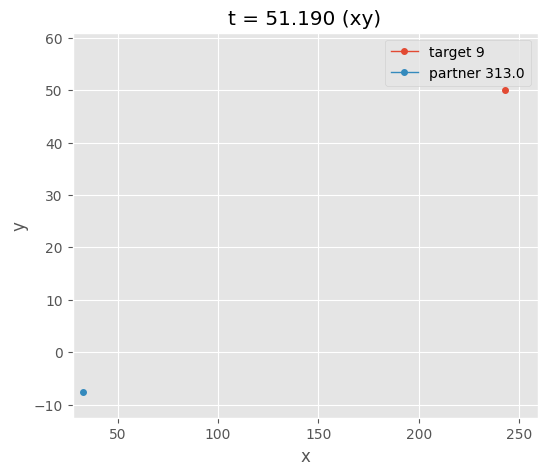

In [48]:
from matplotlib import animation

if sim_xy.empty:
    raise RuntimeError("No partner with sufficient overlap to animate.")

partner_id = sim_xy.iloc[0]["id"]
print(f"Animating target {target_id} vs partner {partner_id} (xy)")

traj_tgt = df[df["id"] == target_id].sort_values("t")
traj_prt = df[df["id"] == partner_id].sort_values("t")
common_t = np.intersect1d(traj_tgt["t"].unique(), traj_prt["t"].unique())
traj_tgt = traj_tgt[traj_tgt["t"].isin(common_t)]
traj_prt = traj_prt[traj_prt["t"].isin(common_t)]

fig, ax = plt.subplots(figsize=(6,5))
ax.set_xlabel("x")
ax.set_ylabel("y")
line1, = ax.plot([], [], 'o-', lw=1, ms=4, label=f"target {target_id}")
line2, = ax.plot([], [], 'o-', lw=1, ms=4, label=f"partner {partner_id}")
ax.legend()

x_all = np.concatenate([traj_tgt["x"].values, traj_prt["x"].values])
y_all = np.concatenate([traj_tgt["y"].values, traj_prt["y"].values])
ax.set_xlim(x_all.min()-5, x_all.max()+5)
ax.set_ylim(y_all.min()-5, y_all.max()+5)

def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return line1, line2

def animate(i):
    t = common_t[i]
    tt = traj_tgt[traj_tgt["t"] == t]
    pp = traj_prt[traj_prt["t"] == t]
    line1.set_data(tt["x"], tt["y"])
    line2.set_data(pp["x"], pp["y"])
    ax.set_title(f"t = {t:.3f} (xy)")
    return line1, line2

ani = animation.FuncAnimation(fig, animate, init_func=init,
                              frames=len(common_t), interval=100, blit=True)

# Save to GIF (requires Pillow)
ani.save("traj_xy_only.gif", writer="pillow", fps=10)
plt.show()

## Pairwise distance vs time (xy) / 成对距离时间序列

In [49]:
# For each other id, compute planar distance d(t) to target, with mean/min stats

def pairwise_distance_xy(df, target_id, min_overlap=5):
    target = df[df["id"] == target_id].sort_values("t")
    ids = [i for i in df["id"].unique() if i != target_id]
    stats = []
    series = {}
    for oid in ids:
        other = df[df["id"] == oid].sort_values("t")
        merged = pd.merge(
            target[["t","x","y","vx","vy","ax","ay"]],
            other[["t","x","y","vx","vy","ax","ay"]],
            on="t",
            suffixes=("_t","_o"),
        )
        n = len(merged)
        if n < min_overlap:
            continue
        d = np.linalg.norm(merged[["x_t","y_t"]].values - merged[["x_o","y_o"]].values, axis=1)
        stats.append({
            "id": oid,
            "mean_dist_xy": float(np.nanmean(d)),
            "min_dist_xy": float(np.nanmin(d)),
            "n_overlap": n,
        })
        series[oid] = {"t": merged["t"].values, "d": d,
                       "speed_t": np.linalg.norm(merged[["vx_t","vy_t"]].values, axis=1),
                       "accel_t": np.linalg.norm(merged[["ax_t","ay_t"]].values, axis=1)}
    if not stats:
        return pd.DataFrame(), series
    return pd.DataFrame(stats).sort_values(["mean_dist_xy","min_dist_xy"], ascending=True), series

pair_stats, pair_series = pairwise_distance_xy(df, target_id, min_overlap=5)
pair_stats.head(10)

,id,mean_dist_xy,min_dist_xy,n_overlap
265,303,13.059739,10.369732,9
266,304,17.922602,16.602785,6
80,93,18.050457,17.260622,5
285,328,28.481392,22.681365,8
419,478,51.474866,49.467902,6
165,189,59.577502,37.082572,23
418,477,68.449320,63.377405,7
304,349,70.270351,15.940237,85
67,78,73.812082,54.214235,69
303,348,78.584479,71.496953,5


## Closest partner by mean distance / 按平均距离最近的个体

In [50]:
top_dist_n = 1
if pair_stats.empty:
    print("No pairs with sufficient overlap.")
else:
    display(pair_stats.head(10))
    closest_ids = pair_stats.head(top_dist_n)["id"].tolist()


,id,mean_dist_xy,min_dist_xy,n_overlap
265,303,13.059739,10.369732,9
266,304,17.922602,16.602785,6
80,93,18.050457,17.260622,5
285,328,28.481392,22.681365,8
419,478,51.474866,49.467902,6
165,189,59.577502,37.082572,23
418,477,68.449320,63.377405,7
304,349,70.270351,15.940237,85
67,78,73.812082,54.214235,69
303,348,78.584479,71.496953,5


## t-d plot for closest pair + relation to target speed/accel / 最近对的距离与速度/加速度关系

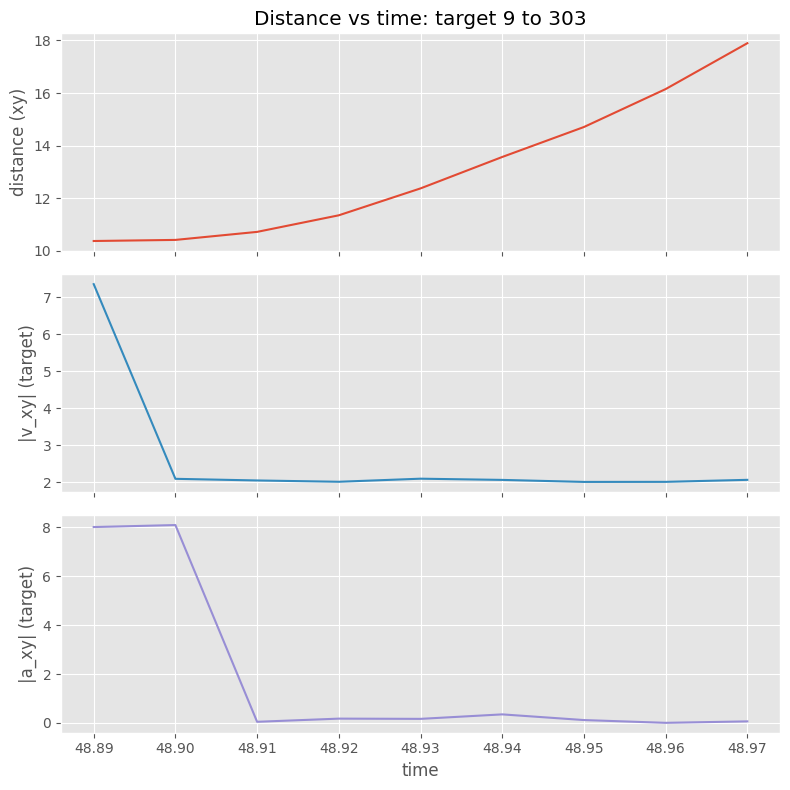

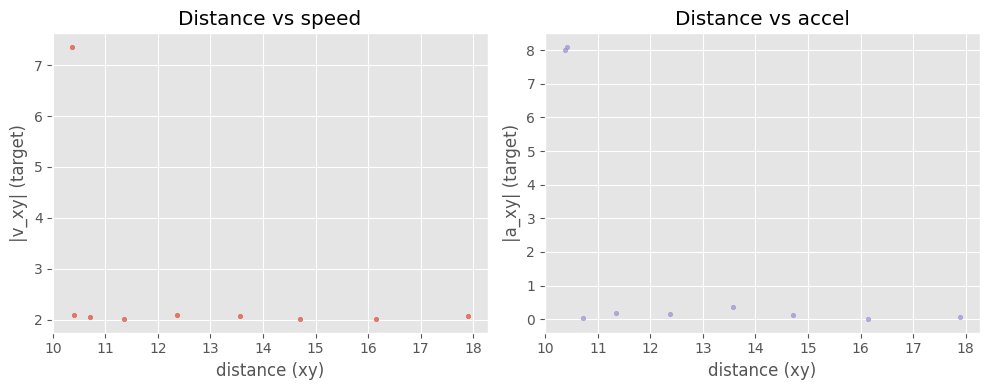

In [51]:
if pair_stats.empty:
    pass
else:
    cid = closest_ids[0]
    s = pair_series[cid]
    t = s["t"]
    d = s["d"]
    speed_t = s["speed_t"]
    accel_t = s["accel_t"]

    fig, axes = plt.subplots(3, 1, figsize=(8,8), sharex=True)
    axes[0].plot(t, d)
    axes[0].set_ylabel("distance (xy)")
    axes[0].set_title(f"Distance vs time: target {target_id} to {cid}")

    axes[1].plot(t, speed_t, color='C1')
    axes[1].set_ylabel("|v_xy| (target)")

    axes[2].plot(t, accel_t, color='C2')
    axes[2].set_ylabel("|a_xy| (target)")
    axes[2].set_xlabel("time")
    plt.tight_layout()
    plt.show()

    # Scatter to see relation distance vs speed/accel
    fig, axes = plt.subplots(1,2, figsize=(10,4))
    axes[0].scatter(d, speed_t, s=10, alpha=0.7)
    axes[0].set_xlabel("distance (xy)")
    axes[0].set_ylabel("|v_xy| (target)")
    axes[0].set_title("Distance vs speed")

    axes[1].scatter(d, accel_t, s=10, alpha=0.7, color='C2')
    axes[1].set_xlabel("distance (xy)")
    axes[1].set_ylabel("|a_xy| (target)")
    axes[1].set_title("Distance vs accel")

    plt.tight_layout()
    plt.show()

## GIF for target + closest-distance partner / 目标与最近距离个体的 GIF 动画

Animating target 9 vs closest-by-distance 303.0 (xy)


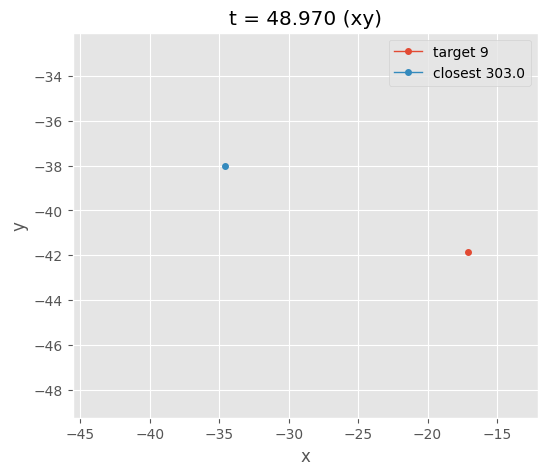

In [53]:
from matplotlib import animation

if pair_stats.empty:
    print("No partner with sufficient overlap to animate.")
else:
    cid = pair_stats.iloc[0]["id"]
    print(f"Animating target {target_id} vs closest-by-distance {cid} (xy)")

    traj_tgt = df[df["id"] == target_id].sort_values("t")
    traj_prt = df[df["id"] == cid].sort_values("t")
    common_t = np.intersect1d(traj_tgt["t"].unique(), traj_prt["t"].unique())
    traj_tgt = traj_tgt[traj_tgt["t"].isin(common_t)]
    traj_prt = traj_prt[traj_prt["t"].isin(common_t)]

    fig, ax = plt.subplots(figsize=(6,5))
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    line1, = ax.plot([], [], 'o-', lw=1, ms=4, label=f"target {target_id}")
    line2, = ax.plot([], [], 'o-', lw=1, ms=4, label=f"closest {cid}")
    ax.legend()

    x_all = np.concatenate([traj_tgt["x"].values, traj_prt["x"].values])
    y_all = np.concatenate([traj_tgt["y"].values, traj_prt["y"].values])
    ax.set_xlim(x_all.min()-5, x_all.max()+5)
    ax.set_ylim(y_all.min()-5, y_all.max()+5)

    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        return line1, line2

    def animate(i):
        t = common_t[i]
        tt = traj_tgt[traj_tgt["t"] == t]
        pp = traj_prt[traj_prt["t"] == t]
        line1.set_data(tt["x"], tt["y"])
        line2.set_data(pp["x"], pp["y"])
        ax.set_title(f"t = {t:.3f} (xy)")
        return line1, line2

    ani = animation.FuncAnimation(fig, animate, init_func=init,
                                  frames=len(common_t), interval=100, blit=True)

    # Save to GIF (requires Pillow)
    ani.save("traj_xy_closest.gif", writer="pillow", fps=3)
    plt.show()

## Single GIF for target vs all (xy) / 全体平面动画（单 GIF）


In [ ]:

try:
    import imageio.v2 as iio  # preferred API
except ImportError:  # fallback
    import imageio as iio
import numpy as np

# Streamed GIF writer: avoids storing all frames; add frame/agent downsampling.
frame_stride = 5    # keep every nth frame; increase for faster/lighter output
start_frame = 0     # inclusive start index in sorted unique times
end_frame = None    # exclusive end index; set an int to limit duration
max_others = 400    # cap number of other agents per frame; set None to use all
fps = 10
gif_path = "traj_xy_all_stream.gif"

all_times = np.sort(df["t"].unique())
times = all_times[start_frame:end_frame:frame_stride]
margin = 5
x_all = df["x"].values
y_all = df["y"].values
xlim = (x_all.min()-margin, x_all.max()+margin)
ylim = (y_all.min()-margin, y_all.max()+margin)

fig, ax = plt.subplots(figsize=(6,5))
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)
ax.set_title("Target (red) vs others (gray) over time")
sc_target = ax.scatter([], [], c='red', s=20, label=f"target {target_id}")
sc_others = ax.scatter([], [], c='gray', s=10, alpha=0.6)
ax.legend(loc='upper right')
fig.tight_layout()

groups = {t: g for t, g in df.groupby("t")}
empty = np.empty((0, 2))

def draw_frame(t):
    g = groups.get(t)
    if g is None or g.empty:
        sc_target.set_offsets(empty)
        sc_others.set_offsets(empty)
    else:
        tgt = g[g["id"] == target_id]
        oth = g[g["id"] != target_id]
        if max_others is not None and len(oth) > max_others:
            oth = oth.sample(max_others, random_state=0)
        sc_target.set_offsets(tgt[["x","y"]].values if not tgt.empty else empty)
        sc_others.set_offsets(oth[["x","y"]].values if not oth.empty else empty)
    ax.set_title(f"t = {t:.3f}")
    fig.canvas.draw()
    img_rgba = np.asarray(fig.canvas.renderer.buffer_rgba())
    img = img_rgba[..., :3].copy()  # drop alpha
    return img

with iio.get_writer(gif_path, mode="I", fps=fps, loop=0) as writer:
    for t in times:
        writer.append_data(draw_frame(t))

plt.close(fig)
print(f"Saved streamed GIF: {gif_path} (frames={len(times)}, stride={frame_stride}, max_others={max_others}, window={start_frame}:{end_frame})")


## 3D GIF for target vs all (filtered) / 全体 3D 动画（筛选版）


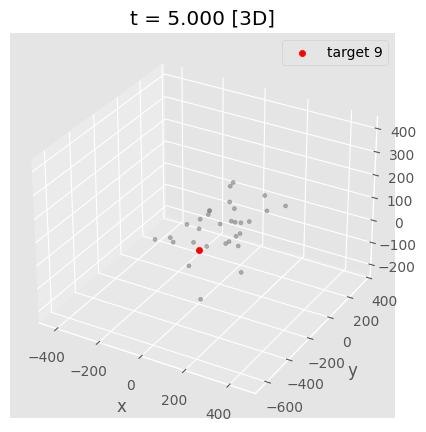

In [ ]:
from matplotlib import animation


# 3D animation of target (red) vs filtered others (gray)
# Options: time window, frame sampling, and spatial radius around target

# --- controls ---
t_min = 1   # e.g., 0.0
# Note: sett_max below
t_max = 2   # e.g., 5.0
every_n = 1    # use every N-th frame
radius = None  # e.g., 50.0 (show only others within this xy radius of target)

all_times = np.sort(df["t"].unique())
if t_min is not None:
    all_times = all_times[all_times >= t_min]
if t_max is not None:
    all_times = all_times[all_times <=t_max]
if every_n > 1:
    all_times = all_times[::every_n]

margin = 5
x_all = df["x"].values
y_all = df["y"].values
z_all = df["z"].values
xlim = (x_all.min()-margin, x_all.max()+margin)
ylim = (y_all.min()-margin, y_all.max()+margin)
zlim = (z_all.min()-margin, z_all.max()+margin)

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)
ax.set_zlim(*zlim)
ax.set_title("Target (red) vs others (gray) over time [3D]")

sc_target = ax.scatter([], [], [], c='red', s=20, label=f"target {target_id}")
sc_others = ax.scatter([], [], [], c='gray', s=8, alpha=0.6)
ax.legend(loc='upper right')

# pre-group by time
_groups = {t: g for t, g in df.groupby("t")}

def init():
    sc_target._offsets3d = ([], [], [])
    sc_others._offsets3d = ([], [], [])
    return sc_target, sc_others

def animate(i):
    t = all_times[i]
    g = _groups.get(t)
    if g is None or g.empty:
        sc_target._offsets3d = ([], [], [])
        sc_others._offsets3d = ([], [], [])
    else:
        tgt = g[g["id"] == target_id]
        oth = g[g["id"] != target_id]
        if not tgt.empty:
            sc_target._offsets3d = (tgt["x"].values, tgt["y"].values, tgt["z"].values)
            if radius is not None and not oth.empty:
                dx = oth["x"].values - tgt["x"].values[0]
                dy = oth["y"].values - tgt["y"].values[0]
                keep = (dx*dx + dy*dy) <= radius*radius
                oth = oth[keep]
        else:
            sc_target._offsets3d = ([], [], [])
        if not oth.empty:
            sc_others._offsets3d = (oth["x"].values, oth["y"].values, oth["z"].values)
        else:
            sc_others._offsets3d = ([], [], [])
    ax.set_title(f"t = {t:.3f} [3D]")
    return sc_target, sc_others

ani = animation.FuncAnimation(fig, animate, init_func=init,
                              frames=len(all_times), interval=100, blit=False)

# Save to GIF (requires Pillow). Uncomment to export:
ani.save("traj_xyz_all.gif", writer="pillow", fps=50)
plt.show()

12-22

## Neighbor definitions (kNN & radius) / 邻居定义：k 近邻与半径

In [35]:
from sklearn.neighbors import NearestNeighbors

# Build neighbor lists on a single frame (xy), two options:
# 1) topological k-NN (excluding self)
# 2) metric radius r (excluding self)

def neighbors_knn_xy(frame, k=6):
    coords = frame[["x","y"]].values
    ids = frame["id"].values
    nbrs = NearestNeighbors(n_neighbors=min(k+1, len(frame))).fit(coords)
    _, indices = nbrs.kneighbors(coords)
    # drop self (index 0)
    neigh_dict = {ids[i]: ids[idx[1:]] for i, idx in enumerate(indices)}
    return neigh_dict

def neighbors_radius_xy(frame, radius=177.5):
    coords = frame[["x","y"]].values
    ids = frame["id"].values
    nbrs = NearestNeighbors(radius=radius).fit(coords)
    indices = nbrs.radius_neighbors(coords, return_distance=False)
    neigh_dict = {ids[i]: ids[idx[idx!=i]] for i, idx in enumerate(indices)}
    return neigh_dict

# Example on a mid-frame
times_all = np.sort(df["t"].unique())
t_demo = times_all[len(times_all)//2]
frame_demo = df[df["t"] == t_demo]

knn_dict = neighbors_knn_xy(frame_demo, k=6)
rad_dict = neighbors_radius_xy(frame_demo, radius=177.5)

# quick stats
knn_counts = [len(v) for v in knn_dict.values()]
rad_counts = [len(v) for v in rad_dict.values()]
print(f"kNN neighbors (k=6): mean={np.mean(knn_counts):.2f}, min={np.min(knn_counts)}, max={np.max(knn_counts)}")
print(f"Radius neighbors (r=177.5): mean={np.mean(rad_counts):.2f}, min={np.min(rad_counts)}, max={np.max(rad_counts)}")

kNN neighbors (k=6): mean=6.00, min=6, max=6
Radius neighbors (r=177.5): mean=15.94, min=0, max=23


## Neighbor-based features to capture / 基于邻居的可提取特征

Examples after defining neighbors:
- neighbor count distribution per id/frame
- alignment with neighbors (velocity direction cosine averaged over neighbors)
- mean neighbor distance (for radius or k-NN with distances)
- contact metrics: time within distance threshold, min/mean distance over time
- time-lagged alignment/correlation (lead/lag) if needed

这些指标可以在后续根据 k 或 r 的邻居列表进行统计。

## Distance boxplot to target / 距离箱线图

In [36]:
# Distance stats over all frames where target is present (xy)
# 统计目标出现的全部帧与其他个体的平面距离

dist_all = []
times_all = np.sort(df["t"].unique())

for t in times_all:
    frame = df[df["t"] == t]
    tgt = frame[frame["id"] == target_id]
    if tgt.empty:
        continue
    pt = tgt[["x","y"]].values[0]
    other = frame[frame["id"] != target_id]
    if len(other) == 0:
        continue
    dists = np.linalg.norm(other[["x","y"]].values - pt, axis=1)
    dist_all.extend(dists.tolist())

if len(dist_all) == 0:
    raise RuntimeError("No distances collected; target may be absent or alone.")

dist_arr = np.array(dist_all)
stats = {
    "count": dist_arr.size,
    "min": dist_arr.min(),
    "max": dist_arr.max(),
    "mean": dist_arr.mean(),
    "median": np.median(dist_arr),
    "p10": np.percentile(dist_arr, 10),
    "p90": np.percentile(dist_arr, 90),
}
print(stats)

# 可选：检查最大距离是否超过 112
if stats["max"] > 1120:
    print(f"Warning: max distance {stats['max']:.2f} > 112")
else:
    print(f"Max distance {stats['max']:.2f} within expected 112")


{'count': 293821, 'min': np.float64(0.20358414548749962), 'max': np.float64(862.1887479623654), 'mean': np.float64(190.9311676743971), 'median': np.float64(177.4728119903147), 'p10': np.float64(68.59891066145856), 'p90': np.float64(328.454533944024)}
Max distance 862.19 within expected 112


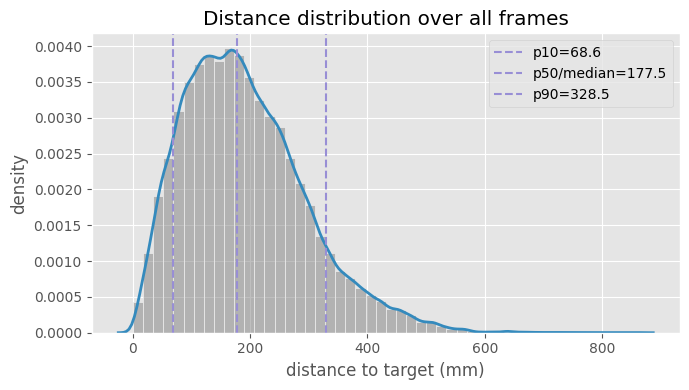

In [37]:
# Distance distribution plot (hist + KDE) with percentiles
import seaborn as sns

dist_arr = np.array(dist_all)  # 确保沿用你前面收集的 dist_all
p10, p50, p90 = np.percentile(dist_arr, [10, 50, 90])

plt.figure(figsize=(7,4))
sns.histplot(dist_arr, bins=50, stat="density", color="gray", alpha=0.5)
sns.kdeplot(dist_arr, color="C1", linewidth=2)
for v, label in [(p10,"p10"), (p50,"p50/median"), (p90,"p90")]:
    plt.axvline(v, color="C2", linestyle="--", label=f"{label}={v:.1f}")
plt.xlabel("distance to target (mm)")
plt.ylabel("density")
plt.title("Distance distribution over all frames")
plt.legend()
plt.tight_layout()
plt.show()


## kNN (k=9) and radius (r=177.5 mm) stats / 邻居距离与数量统计

In [38]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

# Representative frame: middle time
all_t = np.sort(df["t"].unique())
t_demo = all_t[len(all_t)//2]
frame = df[df["t"] == t_demo]
coords = frame[["x","y"]].values
ids = frame["id"].values

# kNN: k=9, average distance to k neighbors
k = 9
nbrs_k = NearestNeighbors(n_neighbors=min(k+1, len(frame))).fit(coords)
dists_k, indices_k = nbrs_k.kneighbors(coords)
# drop self (column 0)
d_k = dists_k[:, 1:k+1]
print(f"kNN (k={k}) at t={t_demo:.3f}: avg dist to k neighbors = {np.mean(d_k):.2f} mm")

# Radius: r=177.5 mm, average neighbor count (excluding self)
r = 177.5
nbrs_r = NearestNeighbors(radius=r).fit(coords)
indices_r = nbrs_r.radius_neighbors(coords, return_distance=False)
neighbor_counts = [len(idx) - 1 for idx in indices_r]
print(f"Radius (r={r} mm) at t={t_demo:.3f}: avg neighbors = {np.mean(neighbor_counts):.2f}, "
      f"min={np.min(neighbor_counts)}, max={np.max(neighbor_counts)}")

# Optional: across all frames, average the same stats
avg_k_dist = []
avg_r_count = []
for t in all_t:
    fr = df[df["t"] == t]
    if len(fr) < 2:
        continue
    c = fr[["x","y"]].values
    # kNN
    nk = min(k+1, len(fr))
    dists, _ = NearestNeighbors(n_neighbors=nk).fit(c).kneighbors(c)
    avg_k_dist.append(np.mean(dists[:, 1:k+1]))
    # radius
    ind = NearestNeighbors(radius=r).fit(c).radius_neighbors(c, return_distance=False)
    counts = [len(idx)-1 for idx in ind]
    avg_r_count.append(np.mean(counts))

if avg_k_dist:
    print(f"Across all frames: kNN(k={k}) avg of mean distances = {np.mean(avg_k_dist):.2f} mm")
if avg_r_count:
    print(f"Across all frames: radius(r={r}) avg of mean neighbor counts = {np.mean(avg_r_count):.2f}")


kNN (k=9) at t=100.010: avg dist to k neighbors = 99.55 mm
Radius (r=177.5 mm) at t=100.010: avg neighbors = 15.94, min=0, max=23
Across all frames: kNN(k=9) avg of mean distances = 100.22 mm
Across all frames: radius(r=177.5) avg of mean neighbor counts = 15.14


## Time series of kNN distances and radius neighbor counts / 随时间的 kNN 距离与半径邻居数

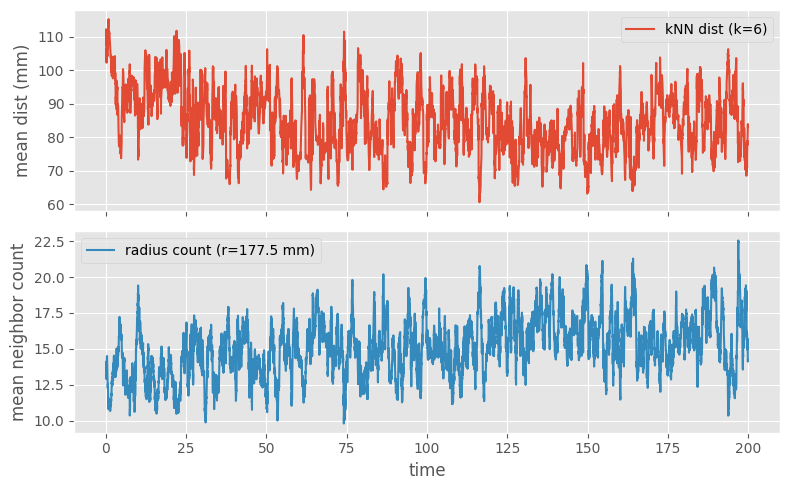

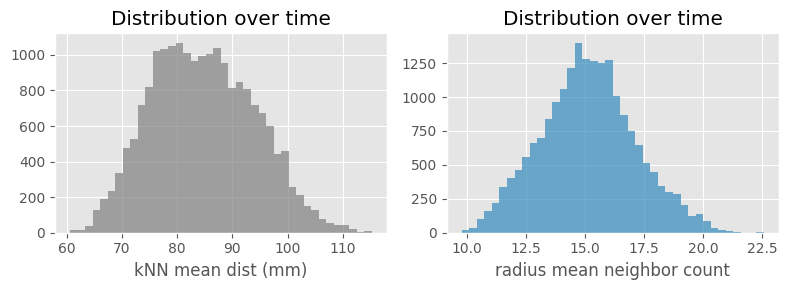

In [39]:
from sklearn.neighbors import NearestNeighbors

k = 6
r = 177.5
all_t = np.sort(df["t"].unique())
knn_mean_dist = []
rad_mean_n = []

for t in all_t:
    fr = df[df["t"] == t]
    if len(fr) < 2:
        knn_mean_dist.append(np.nan)
        rad_mean_n.append(np.nan)
        continue
    c = fr[["x","y"]].values
    # kNN distances to k neighbors
    nk = min(k+1, len(fr))
    dists, _ = NearestNeighbors(n_neighbors=nk).fit(c).kneighbors(c)
    knn_mean_dist.append(np.mean(dists[:, 1:k+1]))
    # radius neighbor counts (excluding self)
    ind = NearestNeighbors(radius=r).fit(c).radius_neighbors(c, return_distance=False)
    counts = [len(idx)-1 for idx in ind]
    rad_mean_n.append(np.mean(counts))

# Plot time series
fig, axes = plt.subplots(2,1, figsize=(8,5), sharex=True)
axes[0].plot(all_t, knn_mean_dist, label=f"kNN dist (k={k})")
axes[0].set_ylabel("mean dist (mm)")
axes[0].legend()
axes[1].plot(all_t, rad_mean_n, label=f"radius count (r={r} mm)", color='C1')
axes[1].set_ylabel("mean neighbor count")
axes[1].set_xlabel("time")
axes[1].legend()
plt.tight_layout()
plt.show()

# Optional distributions
plt.figure(figsize=(8,3))
plt.subplot(1,2,1)
plt.hist([v for v in knn_mean_dist if np.isfinite(v)], bins=40, color='gray', alpha=0.7)
plt.xlabel("kNN mean dist (mm)")
plt.title("Distribution over time")
plt.subplot(1,2,2)
plt.hist([v for v in rad_mean_n if np.isfinite(v)], bins=40, color='C1', alpha=0.7)
plt.xlabel("radius mean neighbor count")
plt.title("Distribution over time")
plt.tight_layout()
plt.show()

In [40]:
from sklearn.neighbors import NearestNeighbors

k = 6
r = 177.5  # mm

all_t = np.sort(df["t"].unique())

# 收集目标与邻居的速度方向余弦、速度模相关、位置相关
cos_list_k, cos_list_r = [], []
corr_speed_k, corr_speed_r = [], []
corr_pos_k, corr_pos_r = [], []

for t in all_t:
    fr = df[df["t"] == t]
    tgt = fr[fr["id"] == target_id]
    if tgt.empty or len(fr) < 2:
        continue
    pt = tgt[["x","y"]].values[0]
    vt = tgt[["vx","vy"]].values[0]
    vt_norm = np.linalg.norm(vt) + 1e-9
    st = vt_norm

    coords = fr[["x","y"]].values
    ids = fr["id"].values
    idx_target = np.where(ids == target_id)[0][0]

    # kNN
    nk = min(k+1, len(fr))
    dists_k, idxs_k = NearestNeighbors(n_neighbors=nk).fit(coords).kneighbors(coords)
    neigh_k = idxs_k[idx_target, 1:]  # 去掉自己
    if len(neigh_k) > 0:
        v_nei = coords[neigh_k]  # 这里只是坐标，下面取速度
        vv = fr.iloc[neigh_k][["vx","vy"]].values
        vv_norm = np.linalg.norm(vv, axis=1) + 1e-9
        cos = (vv @ vt) / (vv_norm * vt_norm)
        cos_list_k.append(np.nanmean(cos))
        # 速度模相关（与邻居平均速度模）
        corr_speed_k.append(np.corrcoef(st, vv_norm.mean())[0,1] if len(vv_norm)>1 else np.nan)
        # 位置相关（x/y 与邻居 x/y 均值）
        neigh_pos_mean = v_nei.mean(axis=0)
        corr_pos_k.append(np.corrcoef(pt, neigh_pos_mean)[0,1] if len(v_nei)>1 else np.nan)

    # radius
    idxs_r = NearestNeighbors(radius=r).fit(coords).radius_neighbors(coords, return_distance=False)
    neigh_r = [j for j in idxs_r[idx_target] if j != idx_target]
    if len(neigh_r) > 0:
        v_nei = coords[neigh_r]
        vv = fr.iloc[neigh_r][["vx","vy"]].values
        vv_norm = np.linalg.norm(vv, axis=1) + 1e-9
        cos = (vv @ vt) / (vv_norm * vt_norm)
        cos_list_r.append(np.nanmean(cos))
        corr_speed_r.append(np.corrcoef(st, vv_norm.mean())[0,1] if len(vv_norm)>1 else np.nan)
        neigh_pos_mean = v_nei.mean(axis=0)
        corr_pos_r.append(np.corrcoef(pt, neigh_pos_mean)[0,1] if len(v_nei)>1 else np.nan)

print("kNN(k=6): mean cos =", np.nanmean(cos_list_k),
      "speed corr =", np.nanmean(corr_speed_k),
      "pos corr =", np.nanmean(corr_pos_k))
print("Radius(r=177.5): mean cos =", np.nanmean(cos_list_r),
      "speed corr =", np.nanmean(corr_speed_r),
      "pos corr =", np.nanmean(corr_pos_r))


C:\Users\Saru\AppData\Local\Temp\ipykernel_3140\1289794654.py:36: RuntimeWarning: Mean of empty slice
  cos_list_k.append(np.nanmean(cos))
d:\miniconda3\envs\Qenv\lib\site-packages\numpy\lib\_function_base_impl.py:3037: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
d:\miniconda3\envs\Qenv\lib\site-packages\numpy\lib\_function_base_impl.py:2894: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\Saru\AppData\Local\Temp\ipykernel_3140\1289794654.py:51: RuntimeWarning: Mean of empty slice
  cos_list_r.append(np.nanmean(cos))
d:\miniconda3\envs\Qenv\lib\site-packages\numpy\lib\_function_base_impl.py:3037: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
d:\miniconda3\envs\Qenv\lib\site-packages\numpy\lib\_function_base_impl.py:2894: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
d:\miniconda3\envs\Qenv\lib\site-packages\numpy\lib\_fun

kNN(k=6): mean cos = 0.05533630093650508 speed corr = nan pos corr = 0.8395868465430016
Radius(r=177.5): mean cos = 0.06288569569720885 speed corr = nan pos corr = 0.6729011689691817


C:\Users\Saru\AppData\Local\Temp\ipykernel_3140\1289794654.py:57: RuntimeWarning: Mean of empty slice
  "speed corr =", np.nanmean(corr_speed_k),
C:\Users\Saru\AppData\Local\Temp\ipykernel_3140\1289794654.py:60: RuntimeWarning: Mean of empty slice
  "speed corr =", np.nanmean(corr_speed_r),
